# Fast Gradient Sign Method (FGSM)

This notebook demonstrates how to generate adversarial examples using the FGSM attack against three pre-trained Convolutional Neural Networks (CNNs): EfficientNetB0, InceptionV3, and MobileNetV2.

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Import models
from tensorflow.keras.applications import EfficientNetB0, InceptionV3, MobileNetV2

# Import specific preprocessing and decoding functions
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_eff, decode_predictions as decode_eff
from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_inc, decode_predictions as decode_inc
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as preprocess_mob, decode_predictions as decode_mob

### Setup Models and Images
We use a dictionary structure to easily manage multiple models, linking them to their specific target sizes and preprocessing functions. This makes the pipeline scalable.

In [2]:
# Helper functions for denormalization based on model preprocessing
def denormalize_eff(img):
    # EfficientNet uses [0, 255] range
    img = tf.clip_by_value(img, 0, 255)
    return img.numpy().squeeze().astype("uint8")

def denormalize_neg1_1(img):
    # MobileNetV2 and InceptionV3 use [-1, 1] range
    img = (img + 1.0) / 2.0 # Convert to [0, 1]
    img = img * 255.0 # Convert to [0, 255]
    img = tf.clip_by_value(img, 0, 255)
    return img.numpy().squeeze().astype("uint8")

# Dictionary with model configurations
models_dict = {
    'MobileNetV2': {
        'model': MobileNetV2(weights='imagenet'),
        'target_size': (224, 224),
        'preprocess_fn': preprocess_mob,
        'decode_fn': decode_mob,
        'denormalize_fn': denormalize_neg1_1
    },
    'EfficientNetB0': {
        'model': EfficientNetB0(weights='imagenet'),
        'target_size': (224, 224),
        'preprocess_fn': preprocess_eff,
        'decode_fn': decode_eff,
        'denormalize_fn': denormalize_eff
    },
    'InceptionV3': {
        'model': InceptionV3(weights='imagenet'),
        'target_size': (299, 299),
        'preprocess_fn': preprocess_inc,
        'decode_fn': decode_inc,
        'denormalize_fn': denormalize_neg1_1
    }
}

# Freeze weights as we only need to perform inference and compute gradients w.r.t inputs
for config in models_dict.values():
    config['model'].trainable = False

# Dictionary for target images
images_dict = {
    'Dog': '../../images/dog.png',
    'Lion': '../../images/lion.png'
}

In [3]:
def load_and_preprocess_image(img_path, target_size, preprocess_fn):
    img_raw = tf.io.read_file(img_path)
    img = tf.image.decode_image(img_raw, channels=3)
    img = tf.cast(img, tf.float32)
    img = tf.image.resize(img, target_size)
    img = preprocess_fn(img) # Dynamic preprocessing
    img = tf.expand_dims(img, axis=0) # Add batch dimension
    return img

def get_imagenet_label(prob, decode_fn):
    return decode_fn(prob, top=1)[0][0] 

def get_imagenet_class_index(prob):
    return tf.argmax(prob, axis=-1).numpy()[0]

def euclidean_distance(img1, img2):
    return np.linalg.norm(img1.numpy() - img2.numpy())

### Fast Gradient Sign Method (FGSM)
The Fast Gradient Sign Method (FGSM) is a white-box adversarial attack designed to fool neural networks by adding a small amount of carefully crafted noise to the input image. It leverages the gradients of the neural network's loss function to create an adversarial example.

The mathematical formulation is:
$$x_{adv} = x + \varepsilon \cdot sign(\nabla_x J(\theta, x, y))$$

Where:
* $x$ is the original input image.
* $\varepsilon$ controls the magnitude of the perturbation.
* $J$ is the loss function, $\theta$ the model weights, and $y$ the true label.

![FGSM attack representation](../../images/FGSM_attack.png)

In [4]:
loss_object = tf.keras.losses.CategoricalCrossentropy()

def fgsm_attack(input_image, input_label, epsilon, current_model):
    with tf.GradientTape() as tape:
        tape.watch(input_image)
        prediction = current_model(input_image)
        loss = loss_object(input_label, prediction)
    
    # Get gradients of the loss w.r.t to the input image
    gradient = tape.gradient(loss, input_image)
    
    # Get the sign of the gradients
    signed_grad = tf.sign(gradient)
    
    # Create the adversarial image
    adv_image = input_image + epsilon * signed_grad
    return adv_image

### Evaluation Loop
Iterate over the selected models, images, and various epsilon values ($\varepsilon$) to observe the degradation of the model's confidence and visual fidelity.


EXECUTING FGSM ATTACKS ON MODEL: MobileNetV2

--- Target Image: Dog ---


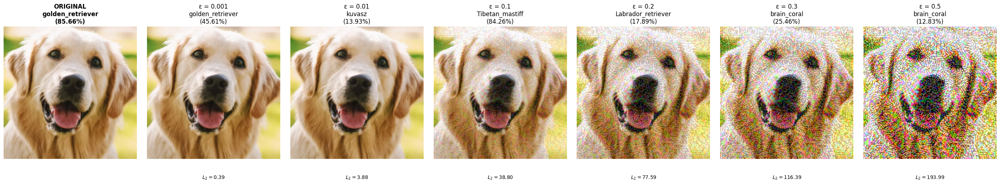

--- Target Image: Lion ---


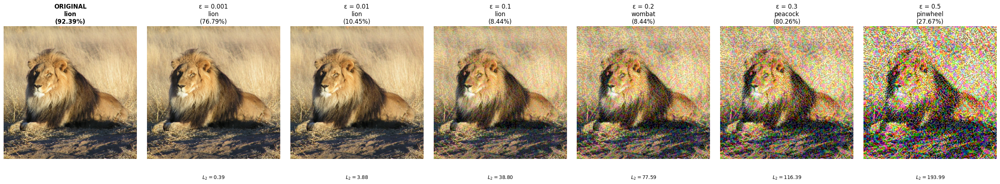


EXECUTING FGSM ATTACKS ON MODEL: EfficientNetB0

--- Target Image: Dog ---


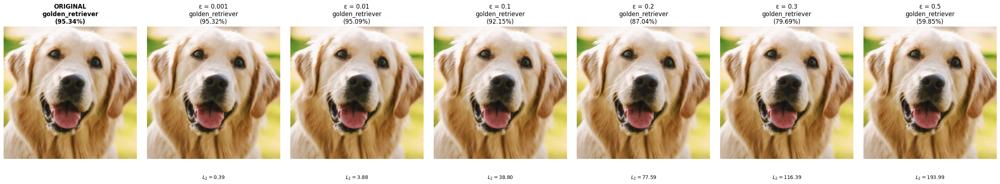

--- Target Image: Lion ---


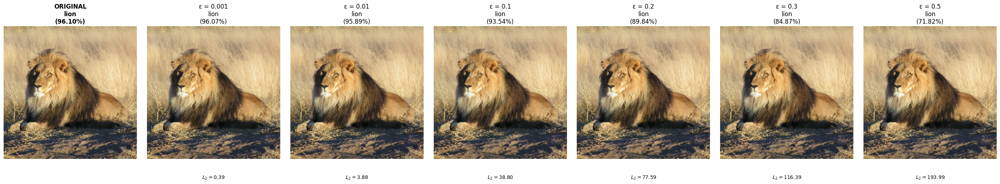


EXECUTING FGSM ATTACKS ON MODEL: InceptionV3

--- Target Image: Dog ---


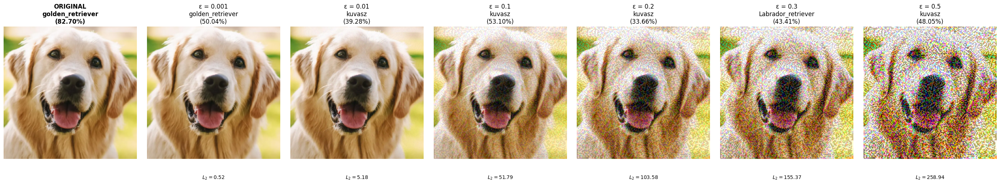

--- Target Image: Lion ---


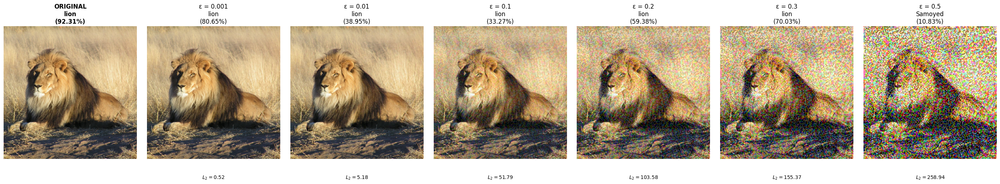

In [5]:
epsilons = [0.001, 0.01, 0.1, 0.2, 0.3, 0.5]
num_cols = len(epsilons) + 1 # +1 to include the original image as a baseline

for model_name, m_config in models_dict.items():
    # Print a clear header when switching models
    print(f"\n{'='*80}")
    print(f"EXECUTING FGSM ATTACKS ON MODEL: {model_name}")
    print(f"{'='*80}\n")
    
    current_model = m_config['model']
    target_size = m_config['target_size']
    preprocess_fn = m_config['preprocess_fn']
    decode_fn = m_config['decode_fn']
    denormalize_fn = m_config['denormalize_fn'] # Dynamic denormalization function
    
    for img_name, img_path in images_dict.items():
        print(f"--- Target Image: {img_name} ---")
        
        # Create a new figure for this specific model and image (1 row, 7 columns)
        fig, axes = plt.subplots(1, num_cols, figsize=(4 * num_cols, 4.5))
        fig.subplots_adjust(wspace=0.1)
        
        # Load and Preprocess
        input_img = load_and_preprocess_image(img_path, target_size, preprocess_fn)
        
        # Get Original Prediction
        original_probs = current_model.predict(input_img, verbose=0)
        _, orig_class_name, orig_prob = get_imagenet_label(original_probs, decode_fn)
        
        # Create One-Hot label for the FGSM loss function
        class_idx = get_imagenet_class_index(original_probs)
        input_label = tf.one_hot(class_idx, original_probs.shape[-1])
        input_label = tf.reshape(input_label, (1, original_probs.shape[-1]))
        
        # Plot Original Image in the first column
        ax_orig = axes[0]
        ax_orig.imshow(denormalize_fn(input_img)) # Apply specific denormalization
        ax_orig.set_title(f'ORIGINAL\n{orig_class_name}\n({orig_prob * 100:.2f}%)', fontweight='bold')
        ax_orig.axis('off')
        
        # Iterate over epsilons
        for col_idx, epsilon in enumerate(epsilons, start=1):
            # Execute FGSM Attack
            adv_img = fgsm_attack(input_img, input_label, epsilon, current_model) 
            
            # Calculate L2 Distance
            l2 = euclidean_distance(input_img, adv_img)
            
            # Get Adversarial Prediction
            adv_img_probs = current_model.predict(adv_img, verbose=0)
            _, adv_img_class, adv_class_prob = get_imagenet_label(adv_img_probs, decode_fn)
            
            # Plot Adversarial Image
            ax = axes[col_idx]
            ax.imshow(denormalize_fn(adv_img))
            ax.set_title(f'ε = {epsilon}\n{adv_img_class}\n({adv_class_prob * 100:.2f}%)')
            ax.text(0.5, -0.15, f'$L_2={l2:.2f}$', transform=ax.transAxes, ha='center', fontsize=10)
            ax.axis('off')
            
        plt.tight_layout()
        plt.show()